In [1]:
%%capture
import warnings
warnings.filterwarnings("ignore")

import os, sys, json
import numpy as np
# from omegaconf import OmegaConf
import shutil
import datetime
import torch, torchvision
import matplotlib.pyplot as plt

from tester.test_retrieval import validation, demo_retrieval
from trainer.engine import engine
from utils.util import seeding, show_demo_test_retrieval
from dataloader.fashion200k_loader import Fashion200k

from omegaconf import OmegaConf
cwd = os.getcwd()

# Load config
config_file = 'config/config.yml'
config = OmegaConf.load((os.path.join(cwd, config_file)))['trainer']
seeding(config)

# Display dataset


In [2]:
dataset = Fashion200k(config, mode = 'train', display=True)

---------- Collecting train dataset!  ----------
1 ,   Reading  top_train_detect_all.txt
Collected  13335  images!
There are 4227 unique captions.


Image: 11055; Source maps to target with the mod string: replace silk with striped


<Figure size 10800x10800 with 0 Axes>

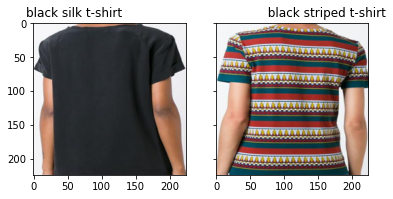

Image: 8915; Source maps to target with the mod string: replace print with medallion


<Figure size 10800x10800 with 0 Axes>

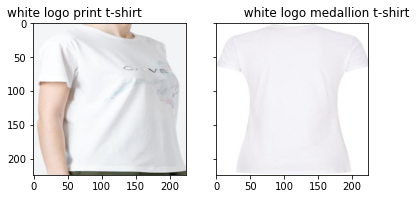

Image: 1318; Source maps to target with the mod string: replace print with edith


<Figure size 10800x10800 with 0 Axes>

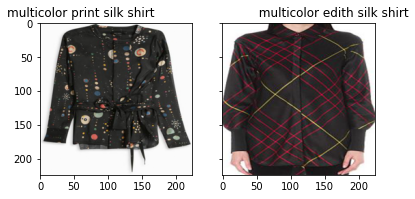

Image: 31; Source maps to target with the mod string: replace cotton with flower


<Figure size 10800x10800 with 0 Axes>

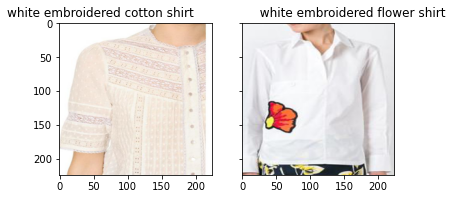

Image: 11468; Source maps to target with the mod string: replace length with sleeve


<Figure size 10800x10800 with 0 Axes>

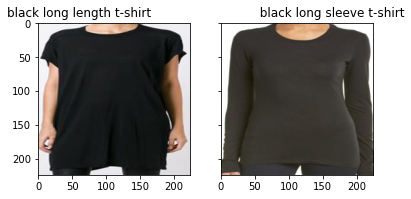

[None, None, None, None, None]

In [3]:
[dataset[i] for i in range(28, 33)]

# Display augmentation

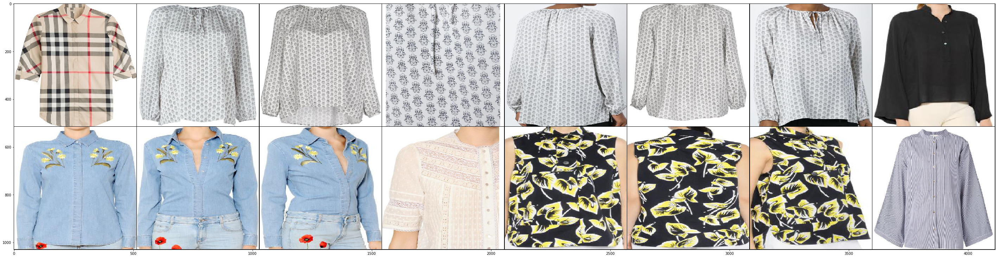

In [4]:
"""Before augmentation
"""
minium, maximum = 20, 36
dataset.display = True

inputs = [dataset.get_img(i) for i in range(minium, maximum)]
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(50, 50))

plt.imshow(out.permute(1, 2, 0))

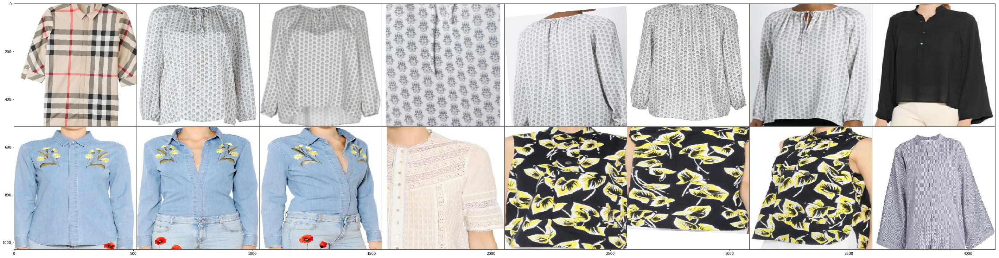

In [5]:
dataset.display = False
dataset.do_aug = True

inputs = [dataset.get_img(i) for i in range(minium, maximum)]
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(50, 50))

show_demo_test_retrieval(out, show=True)

# Training

In [ ]:
engine(config)

# Validation

In [2]:
nn_results = validation(config)

!!!!!!!! Validating progress !!!!!!!!


Using cache found in C:\Users\ASUS/.cache\torch\hub\facebookresearch_deit_main


1 :     16h47
2 :     8h_next_day
3 :     9h
Choose one of these checkpoints: 9h
Checkpoint dist contains:  dict_keys(['epoch', 'state_dict', 'optimizer', 'scheduler'])
---------- Collecting test dataset!  ----------
1 ,   Reading  top_test_detect_all.txt
Collected  2646  images!


100%|██████████████████████████████████████████████████████████████████████████████| 2646/2646 [01:06<00:00, 39.54it/s]


PRECISION Precision_top_1_correct_composition :  : 0.0025
PRECISION Precision_top_10_correct_composition :  : 0.0552
PRECISION Precision_top_50_correct_composition :  : 0.3156
PRECISION Precision_top_100_correct_composition :  : 0.5768
RECALL Recall_top_1_correct_composition :  : 0.0492
RECALL Recall_top_10_correct_composition :  : 0.2258
RECALL Recall_top_50_correct_composition :  : 0.5542
RECALL Recall_top_100_correct_composition :  : 0.7575


## Demo validation

---------- Collecting test dataset!  ----------
1 ,   Reading  top_test_detect_all.txt
Collected  2646  images!
------------------------------
Demo on image:  0


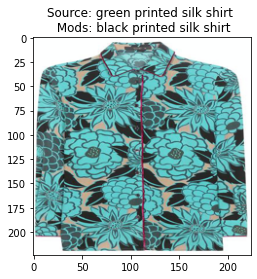

TOP 10 REVELANT RESULTS: 


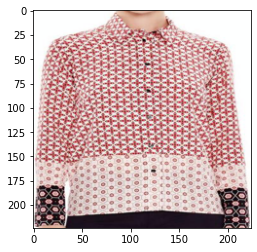

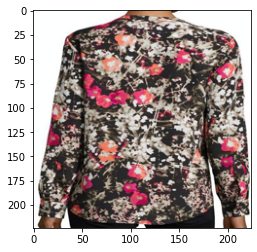

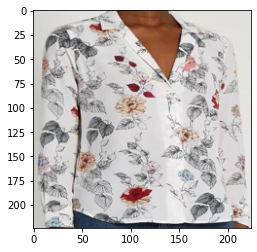

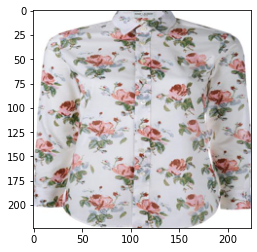

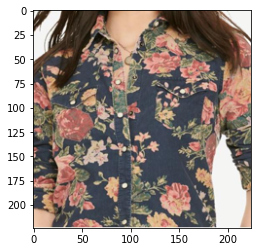

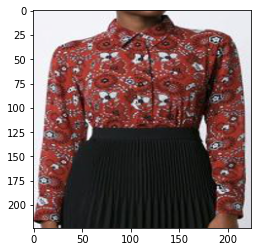

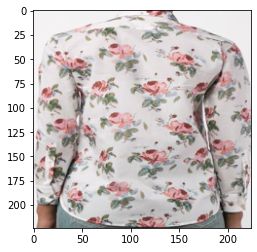

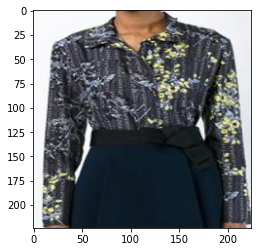

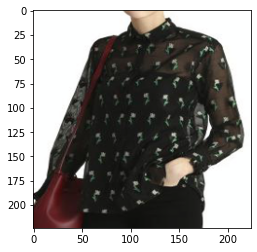

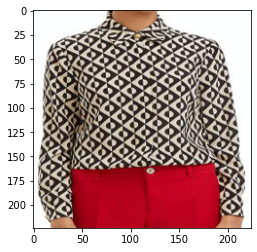

------------------------------
Demo on image:  1


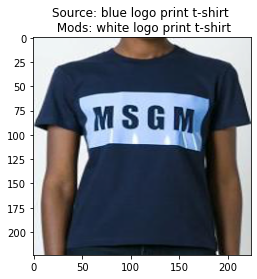

TOP 10 REVELANT RESULTS: 


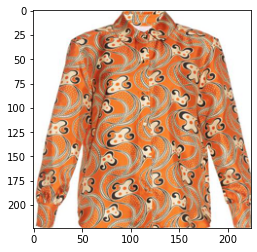

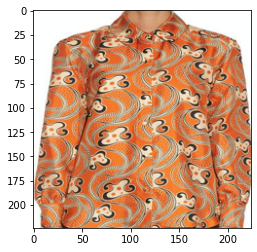

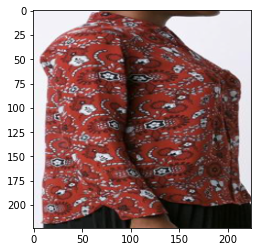

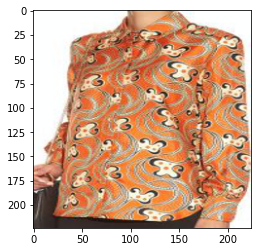

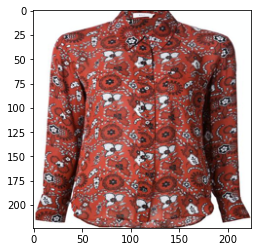

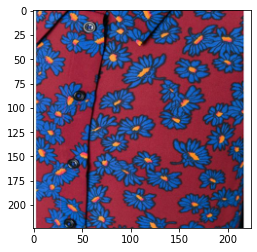

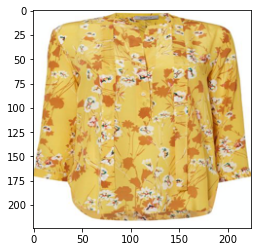

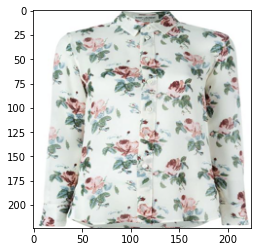

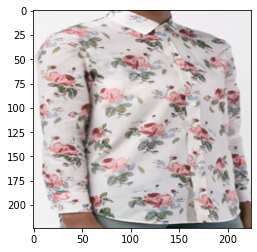

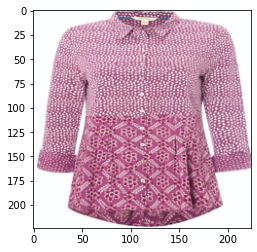

In [9]:
demo_retrieval(config, indexes=np.arange(44, 46), nn_result=nn_results)

# Inference
## Call model

In [2]:
def call_model():
    model = ComposeTransformers(config)

    device = torch.device("cuda:0" if (torch.cuda.is_available() and config.cuda) else "cpu")

    get_checkpoints()
    checkpoint_name = input("Choose one of these checkpoints: ")
    cpkt_fol_name = os.path.join(config.cwd, f'checkpoints/{checkpoint_name}')
    checkpoint_dirmodel = f'{cpkt_fol_name}/latest_checkpoint.pth'

    model, _, _, _ = load_checkpoint(config, checkpoint_dirmodel, model)
    model = model.to(device)
    return model, device

## Index all images from database

In [3]:
import glob
import PIL
from torchvision import transforms
import pandas as pd
from time import time

from img_text_composition_model.compose_transformers import ComposeTransformers
from utils.util import get_checkpoints
from trainer.modelloader import load_checkpoint

model, device = call_model()

Using cache found in C:\Users\ASUS/.cache\torch\hub\facebookresearch_deit_main


1 :     16h47
2 :     8h_next_day
3 :     9h
Choose one of these checkpoints: 9h
Checkpoint dist contains:  dict_keys(['epoch', 'state_dict', 'optimizer', 'scheduler'])


In [4]:
all_images_path = os.path.join(cwd, 'fashion200k\\women\\tops')
all_images_path = glob.glob(all_images_path+'\\*\\*\\*.jpeg')

print('all images in the dataset:', len(all_images_path))

all images in the dataset: 24657


## Get dictionary including {image path, image features}

In [5]:
def process_img(img_path):
    img = PIL.Image.open(img_path).convert('RGB')
    img = img.resize(config.dataset.img_size)
    
    simple_transformations = transforms.Compose([\
                                transforms.ToTensor(),\
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                        std=[0.229, 0.224, 0.225])])
    
    input_tensor = torch.unsqueeze(simple_transformations(img), 0).to(device)  
    img_ftr = model.extract_img_feature(input_tensor).data.cpu().numpy()
    
    return {'path': img_path.split('\\', 5)[-1], 'feature': img_ftr}

In [135]:
all_img_paths, all_features = [], []
start_time = time()

for image_path in all_images_path:
    feature_dict = process_img(image_path)
    
    all_img_paths.append(feature_dict['path'])
    all_features.append(feature_dict['feature'])

print(f'Inference time of feature extractor for {len(all_images_path)} images: {time() - start_time}')
np.savez_compressed(str(cwd + "\\IMAGE_FTRS"), array1=all_img_paths, array2=all_features)

Inference speed of feature extractor for 24657 images: 688.0077874660492


## Ready to perform queries

In [12]:
inference_path = 'C:/Users/ASUS/OneDrive/Desktop'
img_path_ftrs = np.load(str(cwd + "\\IMAGE_FTRS.npz"), allow_pickle=True)

img_paths = img_path_ftrs.f.array1
img_ftrs = img_path_ftrs.f.array2.squeeze(1)

img_ftrs_tensor = torch.tensor(img_ftrs).cuda()

In [7]:
def img_text_composition_inference(img_path, text_query):
    """
    """
    model.eval()
    simple_transformations = transforms.Compose([\
                                transforms.ToTensor(),\
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                        std=[0.229, 0.224, 0.225])])
    img_path = os.path.join(inference_path, img_path)

    quer_img = PIL.Image.open(img_path).convert('RGB')
    quer_img = quer_img.resize(config.dataset.img_size)

    input_tensor = torch.unsqueeze(simple_transformations(quer_img), 0).to(device) 
    dct_with_representations = model.compose_img_text(input_tensor, [text_query])
    
    return dct_with_representations["repres"].data.to(device)

In [8]:
def inference(img_path, text_query, num_results=10):
    """
    """
    compose_ftrs = img_text_composition_inference(img_path, str(text_query))
    cosine_sims = torch.nn.functional.cosine_similarity(compose_ftrs, img_ftrs_tensor)

    similarity_results = cosine_sims.cpu().numpy()
    most_relevance_idx = similarity_results.argsort()[-num_results:][::-1]
    
    cnt = 1
    for idx in most_relevance_idx:
        img_path = os.path.join(config.dataset.path, img_paths[idx])
        img = PIL.Image.open(img_path).convert('RGB')
        
        print('Result: ', cnt)
        plt.imshow(img)
        plt.pause(0.001)
        cnt += 1

### Inference with Query image and Query text

Query image path:  19_72af590600-asket_den_stone_bleach_slide_01-original.jpg
Query text:  white cotton long sleeve shirt


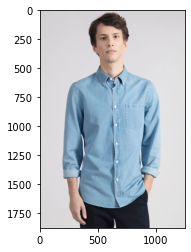

In [13]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img_path = input("Query image path:  ")
text_query = input("Query text:  ")
img = mpimg.imread(os.path.join(inference_path, img_path))

imgplot = plt.imshow(img)
plt.show()

Query image path:  19_72af590600-asket_den_stone_bleach_slide_01-original.jpg
Query text:  white cotton long sleeve shirt
Result:  1


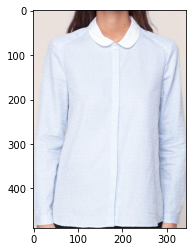

Result:  2


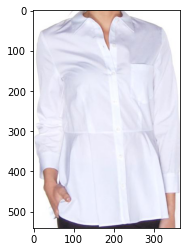

Result:  3


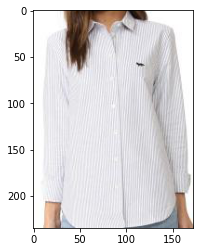

Result:  4


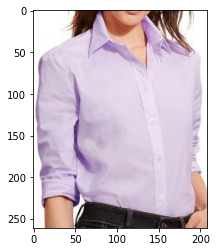

Result:  5


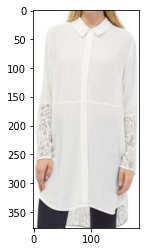

Result:  6


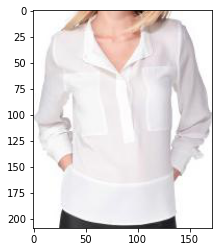

Result:  7


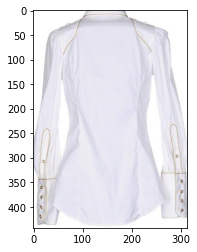

Result:  8


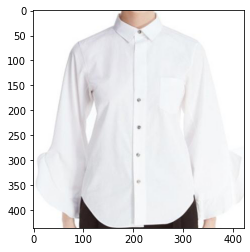

Result:  9


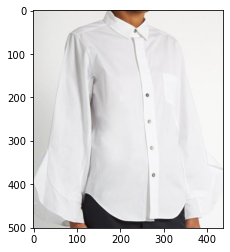

Result:  10


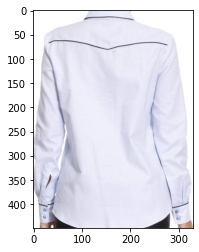

Inference time: 0:00:10.145841 s


In [21]:
from datetime import datetime 

start =  datetime.now()
inference(img_path, text_query)
print("Inference time:",  datetime.now() - start, "s")
# Query image path:  19_72af590600-asket_den_stone_bleach_slide_01-original.jpg
# Query text:  white cotton long sleeve shirt

### Inference with only Query image

Query image path:  19_72af590600-asket_den_stone_bleach_slide_01-original.jpg
Query text:  
Result:  1


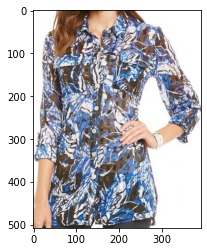

Result:  2


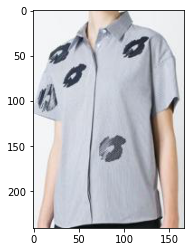

Result:  3


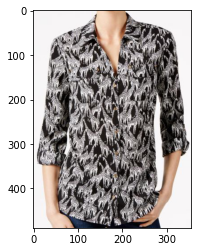

Result:  4


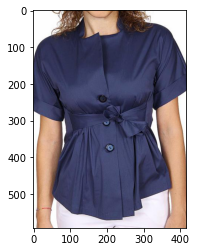

Result:  5


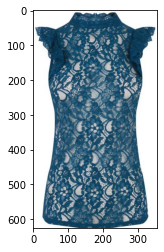

Result:  6


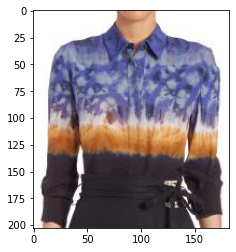

Result:  7


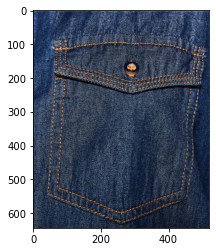

Result:  8


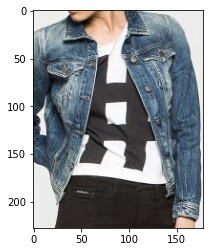

Result:  9


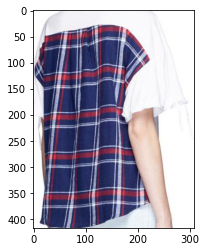

Result:  10


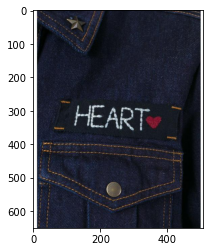

Inference time: 0:00:08.178714 s


In [11]:
from datetime import datetime 
start =  datetime.now()

img_path = input("Query image path:  ")
text_query = input("Query text:  ")

inference(img_path, text_query)
print("Inference time:",  datetime.now() - start, "s")
# Query image path:  19_72af590600-asket_den_stone_bleach_slide_01-original.jpg
# Query text:  white cotton long sleeve shirt